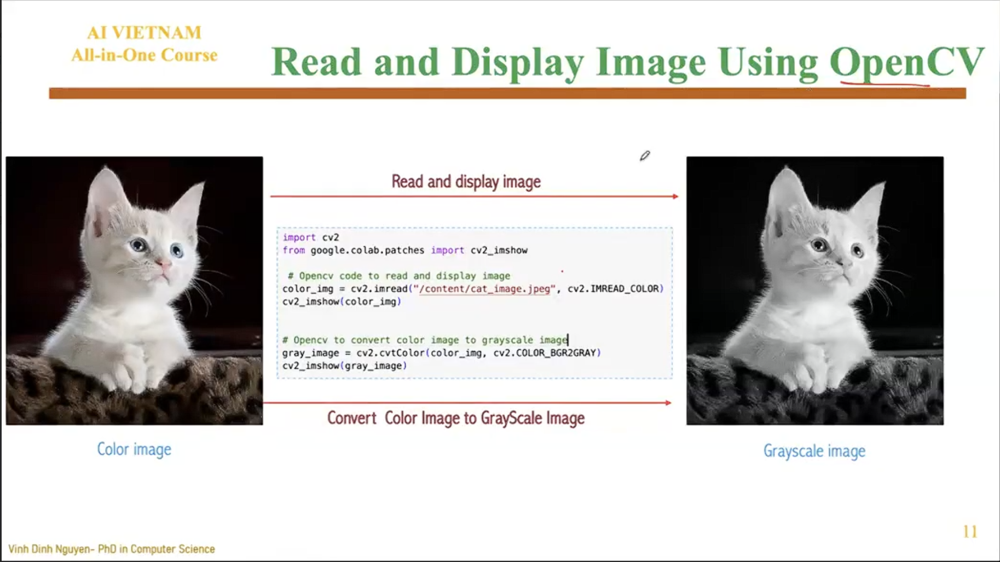

- Để đọc ảnh xám trực tiếp bằng imread, ta thường dùng cờ cv2.IMREAD_GRAYSCALE (hoặc truyền số 0): cv2.imread("image.jpg", cv2.IMREAD_GRAYSCALE).
- Thực chất, OpenCV không lấy trung bình cộng đơn giản của 3 ma trận theo kiểu (R + G + B) / 3. Thay vào đó, nó tính trung bình có trọng số (weighted average) của từng điểm ảnh (pixel) trên 3 kênh màu.

**Công thức cụ thể OpenCV sử dụng**

$$Gray = 0.299 \times R + 0.587 \times G + 0.114 \times B$$

- Kênh Green (Xanh lá - 58.7%): Mắt người có nhiều tế bào nón nhạy cảm với dải ánh sáng xanh lá nhất. Do đó, màu xanh lá quyết định phần lớn độ sáng/tối (luminance) mà ta cảm nhận được.
- Kênh Red (Đỏ - 29.9%): Độ nhạy của mắt với màu đỏ đứng thứ hai.
- Kênh Blue (Xanh dương - 11.4%): Mắt người ít nhạy cảm với ánh sáng xanh dương nhất, nên nó đóng góp ít nhất vào độ sáng tổng thể của bức ảnh xám.

In [ ]:
import cv2

color_img = cv2.imread('path', cv2.IMREAD_COLOR)
cv2.imshow(color_img)

# Convert color to grayscale image
gray_img = cv2.imread('path', cv2.IMREAD_GRAYSCALE)
cv2.imshow(gray_img)

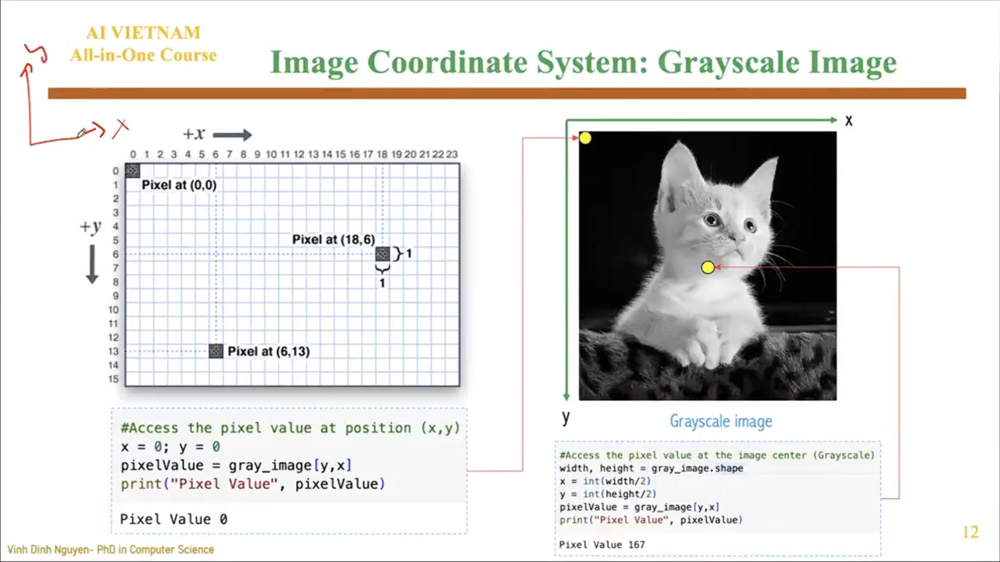

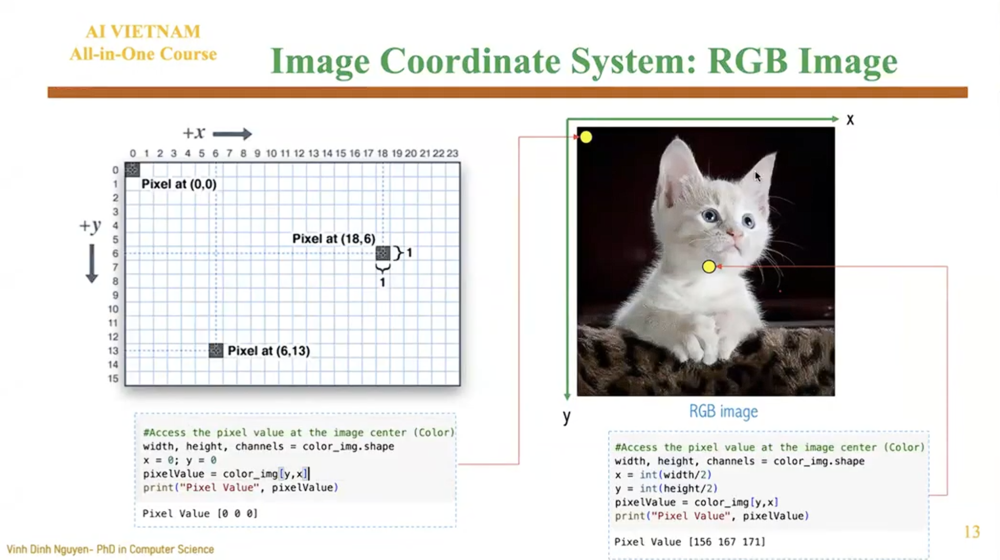

# EDGE DETECTION

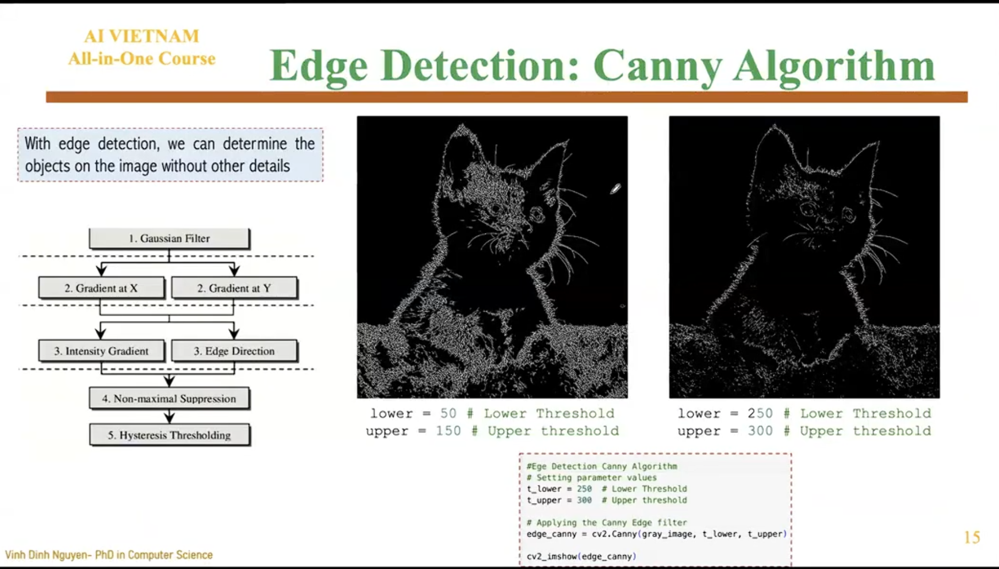

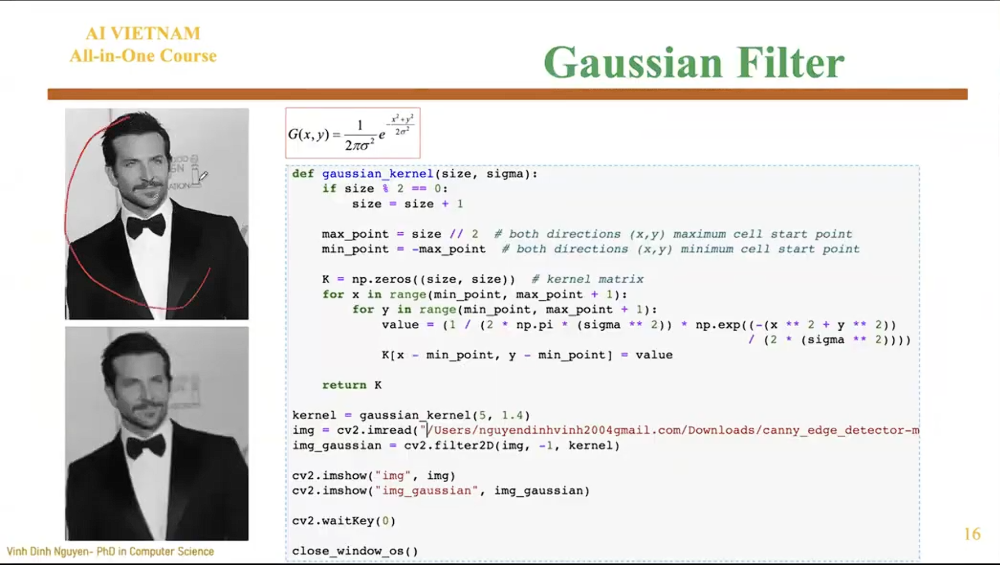

**1. Tại sao phải dùng Gaussian Filter trong dò biên (Edge Detection)?**

- Bản chất của việc tìm cạnh (edge) trong ảnh là tìm những nơi mà cường độ sáng (pixel intensity) thay đổi đột ngột (ví dụ: từ màu đen chuyển gắt sang màu trắng). Để tìm sự thay đổi này, máy tính dùng phép tính đạo hàm.
- Tuy nhiên, hình ảnh thực tế luôn chứa nhiễu (noise) - những hạt sạn nhỏ ngẫu nhiên. Nếu tính đạo hàm trực tiếp trên ảnh có nhiễu, máy tính sẽ nhầm lẫn những hạt nhiễu đó là các cạnh, dẫn đến kết quả tìm biên bị sai lệch nghiêm trọng (bức ảnh sẽ chi chít những đường nét vụn vặt).
Nhiệm vụ của Gaussian Filter là làm mờ ảnh (blur) để khử nhiễu, làm cho bức ảnh mịn hơn trước khi tiến hành tính đạo hàm tìm cạnh. Nó giữ lại được các cấu trúc lớn (cạnh thật) và xóa đi các chi tiết vụn vặt (nhiễu).

**2. Gaussian Filter hoạt động như thế nào?**

- Thay vì lấy trung bình cộng đơn giản của các pixel xung quanh (Average Filter) làm cho ảnh bị mờ một cách thô bạo và làm nhòe luôn cả các cạnh thật, Gaussian Filter lấy trung bình có trọng số dựa trên hàm phân phối chuẩn Gaussian (hình quả chuông).
- Điểm ảnh ở vị trí trung tâm sẽ có trọng số cao nhất (đóng góp nhiều nhất vào kết quả), và trọng số giảm dần khi đi ra xa trung tâm. Điều này giúp ảnh vừa sạch nhiễu mà vẫn bảo toàn được độ sắc nét của các đường biên tốt hơn.
- Công thức toán học của bộ lọc Gaussian 2 chiều được biểu diễn như sau:
$$G(x, y) = \frac{1}{2\pi\sigma^2} e^{-\frac{x^2 + y^2}{2\sigma^2}}$$
- Trong đó:
    - $x, y$ là khoảng cách tính từ điểm gốc (tâm của bộ lọc).
    - $\sigma$ (Sigma) là độ lệch chuẩn, quyết định độ mờ của ảnh. $\sigma$ càng lớn, biểu đồ hình chuông càng bè ra, ảnh càng mờ.

In [14]:
import math

# ==========================================
# 1. HÀM TẠO MA TRẬN GAUSSIAN
# ==========================================
def create_gaussian_kernel(size, sigma):
    """
    Tạo ma trận Gaussian vuông kích thước size x size.
    Lưu ý: size bắt buộc phải là số lẻ (ví dụ: 3, 5, 7).
    """
    kernel = []
    center = size // 2
    sum_val = 0.0

    for i in range(size):
        row = []
        for j in range(size):
            # Tính khoảng cách x, y tính từ tâm ma trận
            x = i - center
            y = j - center

            exponent = math.exp(-(x**2 + y**2) / (2 * sigma**2))
            value = (1 / 2 * math.pi * sigma**2) * exponent

            row.append(value)
            sum_val += value
        kernel.append(row)
    
    # Chuẩn hóa: Chia từng phần tử cho tổng để đảm bảo tổng = 1
    for i in range(size):
        for j in range(size):
            kernel[i][j] = kernel[i][j] / sum_val
    return kernel


# ==========================================
# 2. HÀM TÍCH CHẬP (CONVOLUTION) LÀM MỜ ẢNH
# ==========================================
def apply_gaussian_filter(image, kernel):
    """
    Quét kernel qua ảnh 2 chiều.
    image: list of lists chứa giá trị pixel (0-255).
    """
    img_height = len(image)
    img_width = len(image[0])
    kernel_size = len(kernel)
    pad = kernel_size // 2

    # Tạo một bức ảnh rỗng (toàn số 0) có cùng kích thước để chứa kết quả
    result = [[0 for _ in range(img_width)] for _ in range(img_height)]

    # Quét qua từng pixel của ảnh gốc
    # (Bỏ qua các viền ngoài cùng bằng kích thước 'pad' để tránh lỗi vượt quá mảng)
    for i in range(pad, img_height - pad):
        for j in range(pad, img_width - pad):

            new_pixel_val = 0.0

            # Quét ma trận kernel lên vùng ảnh xung quanh pixel (i, j)
            for ki in range(kernel_size):
                for kj in range(kernel_size):
                    img_x = i + ki - pad
                    img_y = j + kj - pad

                    # Nhân chập và cộng dồn
                    new_pixel_val += image[img_x][img_y] * kernel[ki][kj]
                
            # Ép kiểu về số nguyên và đảm bảo giá trị nằm trong khoảng [0, 255]
            result[i][j] = max(0, min(int(new_pixel_val), 255))
    return result

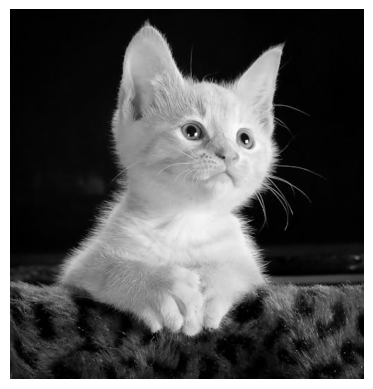

In [8]:
import matplotlib.pyplot as plt
import cv2
img = cv2.imread(r'C:\Code_AI\AIO_Code\Module5\IntroToCV\cat.jpeg', cv2.IMREAD_GRAYSCALE)
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()

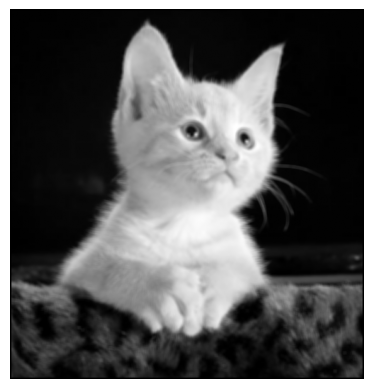

In [18]:
kernel = create_gaussian_kernel(size=5, sigma=10.0)
blurred_image = apply_gaussian_filter(img, kernel)
plt.imshow(blurred_image, cmap='gray')
plt.axis('off')
plt.show()

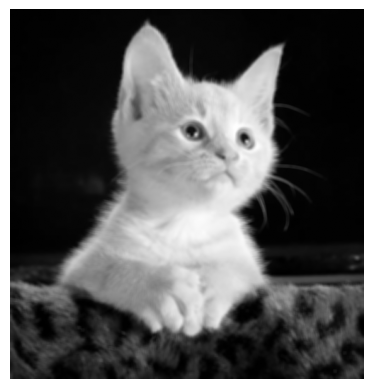

In [20]:
import numpy as np
kernel_list = create_gaussian_kernel(5, 10.0)
kernel_numpy = np.array(kernel_list, dtype=np.float32)

img_gaussian = cv2.filter2D(img, -1, kernel_numpy)

plt.imshow(img_gaussian, cmap='gray')
plt.axis('off') 
plt.show()

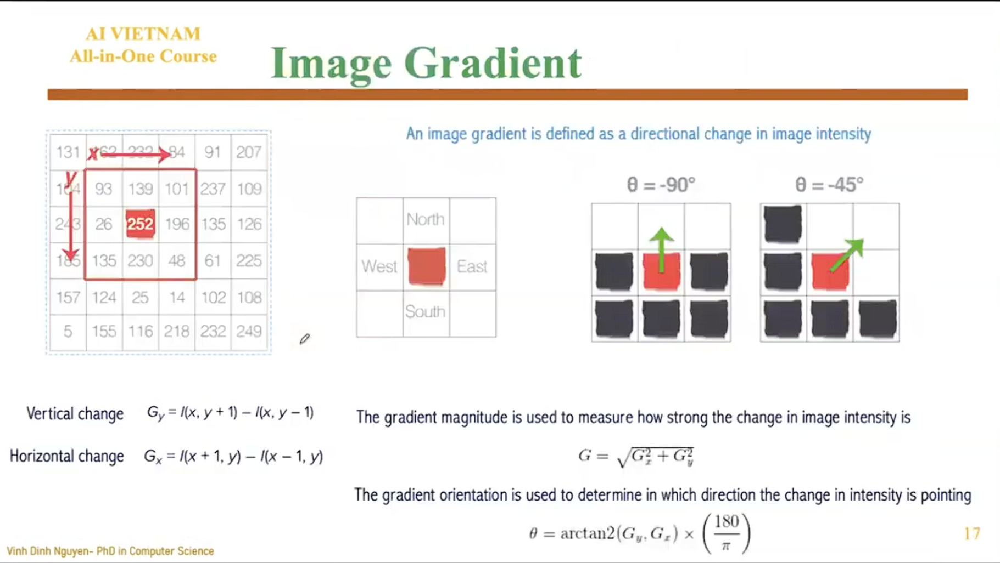

**1. Có phải luôn luôn tính gradient bằng cách lấy pixel liền trước và liền sau không?**

- Không hoàn toàn đúng. Trong bức ảnh, công thức $G_y$ và $G_x$ đang sử dụng phương pháp cơ bản nhất gọi là sai phân trung tâm (Central Difference): lấy pixel ngay liền sau trừ đi pixel ngay liền trước nó.
- Tuy nhiên, trong thực tế xử lý ảnh, việc chỉ dùng đúng 2 pixel kề nhau như vậy tiềm ẩn rủi ro rất lớn: cực kỳ nhạy cảm với nhiễu (noise). Chỉ cần 1 pixel bị nhiễu sáng lên bất thường, kết quả gradient sẽ bị sai lệch hoàn toàn.
- Do đó, các thuật toán hiện đại (như Sobel hay Prewitt) không dùng cách trừ trực tiếp 2 pixel này, mà chúng sử dụng các ma trận (kernel) kích thước 3x3 hoặc 5x5. Việc này nhằm mục đích kết hợp thêm trọng số của các pixel xung quanh để "làm mềm" sự thay đổi, giúp tính toán gradient chính xác và kháng nhiễu tốt hơn rất nhiều. Công thức trong hình là nền tảng lý thuyết cơ bản nhất để dễ hiểu bản chất.

**2. Tính độ lớn của gradient ($G$) có tác dụng gì?**

- Tác dụng thực tế: Giá trị $G = \sqrt{G_x^2 + G_y^2}$ chính là "chiếc máy dò" để tìm ra các góc cạnh trên ảnh.
- Nếu $G$ nhỏ (gần 0), có nghĩa là màu sắc khu vực đó rất đồng đều, không có sự biến thiên (ví dụ: một mảng tường trắng).
- Nếu $G$ rất lớn, có nghĩa là tại điểm đó độ sáng bị thay đổi cực kỳ đột ngột (ví dụ: chuyển gắt từ áo màu đen sang phông nền màu trắng). Sự thay đổi đột ngột này chính xác là đường biên (edge) mà máy tính đang cần tìm.

**3. Công thức tính góc bằng hàm $\arctan$ cuối cùng có tác dụng gì?**

- Hàm $\arctan2$ giúp máy tính tìm ra góc $\theta$ (đơn vị radian) của vector gradient.
- Phần nhân với $\frac{180}{\pi}$ chỉ đơn giản là phép toán đổi từ radian sang độ (degrees) để con người dễ đọc hơn (như góc -90° hay -45° minh họa trên hình).

- Tác dụng thực tế trong Dò biên (Canny): Tính ra hướng của cạnh là một bước bắt buộc phải có. Nhờ biết được cạnh đang nằm ngang, nằm dọc hay nằm chéo, thuật toán Canny sẽ thực hiện một bước gọi là Non-maximum Suppression (Lọc cực đại cục bộ) dọc theo hướng vuông góc với cạnh đó. Bước này có nhiệm vụ loại bỏ các pixel mờ nhạt xung quanh, giúp gọt giũa đường viền dày cộm trở thành một đường biên cực kỳ sắc nét, mỏng đúng 1 pixel!

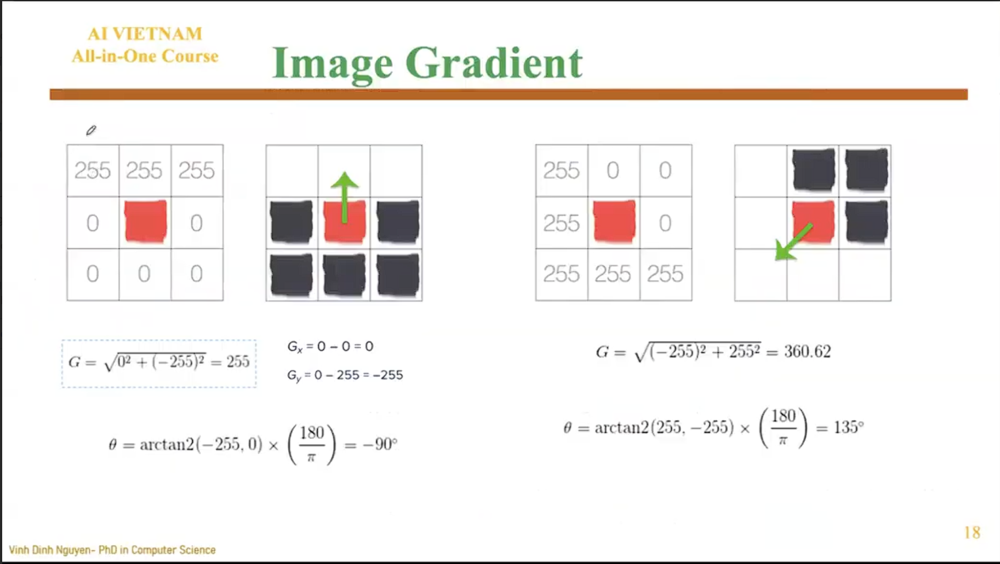

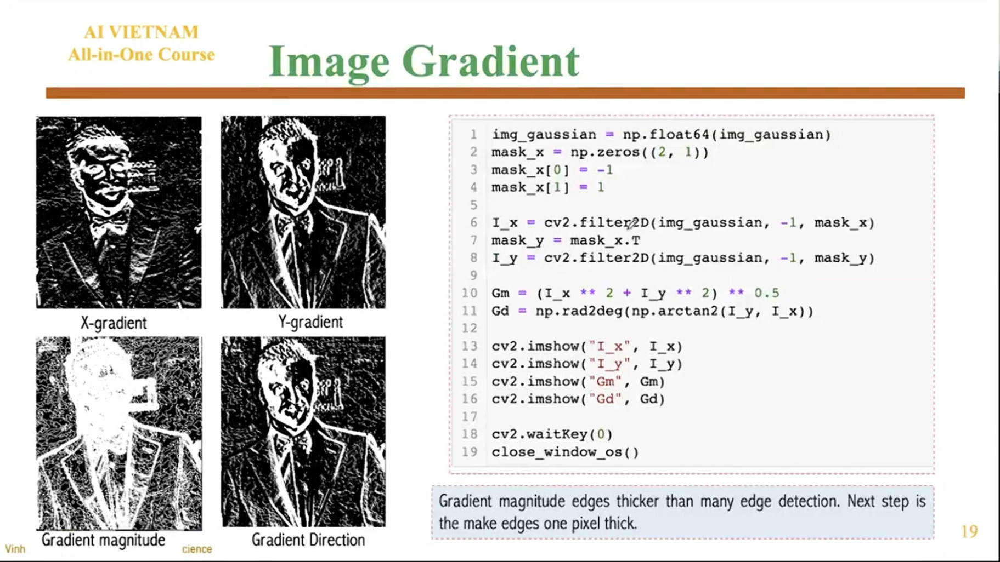


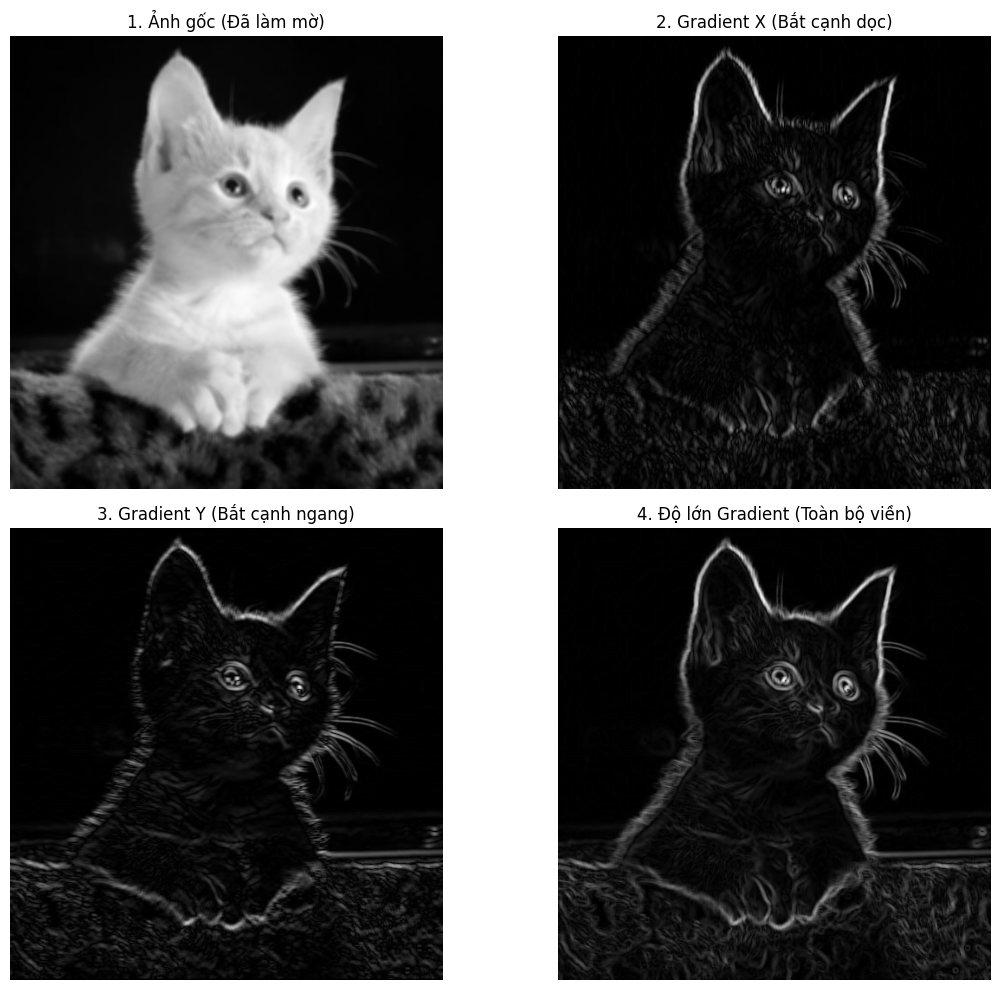

In [24]:
img_float = np.float64(img_gaussian)

# ==========================================
# BƯỚC 1: TÍNH ĐẠO HÀM (GRADIENT) THEO 2 HƯỚNG
# ==========================================

# Ma trận tính đạo hàm theo chiều ngang (Trục X)
kernel_x = np.array([[-1, 0, 1]], dtype=np.float64)
gradient_x = cv2.filter2D(img_float, -1, kernel_x)

# Ma trận tính đạo hàm theo chiều dọc (Trục Y)
kernel_y = np.array([[-1],
                     [0],
                     [1]], dtype=np.float64)
gradient_y = cv2.filter2D(img_float, -1, kernel_y)

# ==========================================
# BƯỚC 2: TÍNH ĐỘ LỚN VÀ HƯỚNG CỦA GRADIENT
# ==========================================
magnitude = np.sqrt(gradient_x**2 + gradient_y**2)

angle_rad = np.arctan2(gradient_y, gradient_x)
angle_deg = np.rad2deg(angle_rad)

# Lấy trị tuyệt đối để hiển thị cho Gx và Gy
grad_x_display = np.abs(gradient_x)
grad_y_display = np.abs(gradient_y)

# ==========================================
# 4. HIỂN THỊ KẾT QUẢ BẰNG MATPLOTLIB
# ==========================================
# Tạo một khung vẽ (figure) chứa 4 ảnh con (2 hàng, 2 cột)

plt.figure(figsize=(12, 10))

plt.subplot(2, 2, 1)
plt.imshow(img_gaussian, cmap='gray')
plt.title('1. Ảnh gốc (Đã làm mờ)')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(grad_x_display, cmap='gray')
plt.title('2. Gradient X (Bắt cạnh dọc)')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(grad_y_display, cmap='gray')
plt.title('3. Gradient Y (Bắt cạnh ngang)')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(magnitude, cmap='gray')
plt.title('4. Độ lớn Gradient (Toàn bộ viền)')
plt.axis('off')

plt.tight_layout()
plt.show()

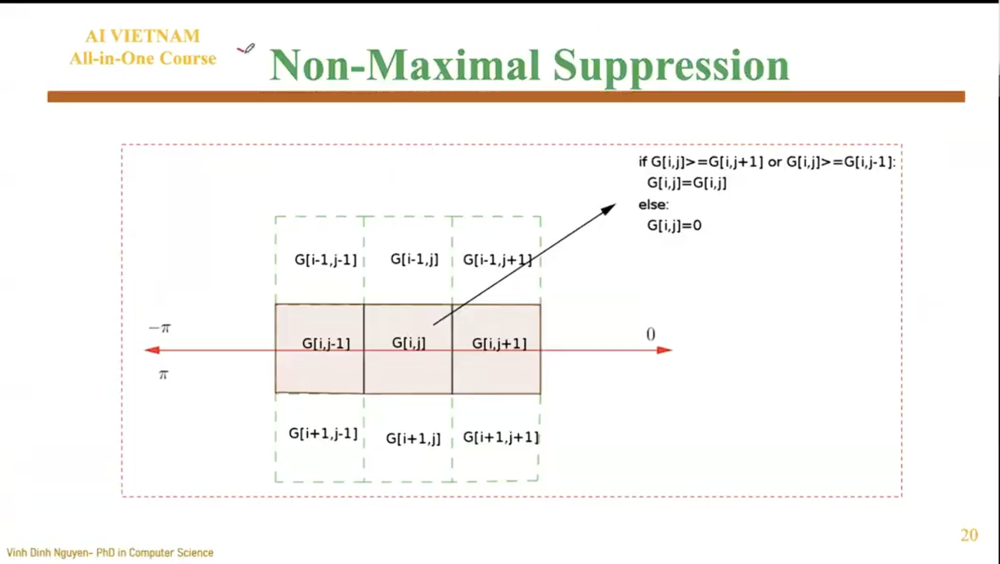

"Gradient magnitude edges thicker than many edge detection. Next step is to make edges one pixel thick" (Độ lớn gradient tạo ra các đường biên khá dày. Bước tiếp theo là làm cho chúng mỏng đúng bằng 1 pixel).

**1. Ý tưởng cốt lõi: "Trò chơi Vua Vùng Đồi"**

- Hãy tưởng tượng một đường biên (edge) bị nhòe giống như một sườn núi thoai thoải. Trên sườn núi đó, có rất nhiều pixel cùng sáng lên (dày cộm), nhưng chỉ có duy nhất một đỉnh núi cao nhất - đó chính là đường biên thật sự sắc nét mà ta muốn giữ lại.

- Nhiệm vụ của cơ chế này là đi dọc theo sườn núi, giữ lại điểm cao nhất (Cực đại - Maximal) và gạch bỏ (Triệt tiêu - Suppression) tất cả những điểm thấp hơn xung quanh nó thành màu đen (giá trị 0).

**2. Giải phẫu cơ chế trong hình**

- Mũi tên màu đỏ: Đây chính là hướng của Gradient (cái góc $\theta$ mà ta dùng hàm $\arctan$ để tính ở bước trước). Mũi tên nằm ngang (góc $0$ hoặc $\pi, -\pi$) cho biết độ sáng đang thay đổi theo chiều ngang $\rightarrow$ Đường biên thực tế đang là một đường dọc.
- 3 ô vuông được tô màu: Vì hướng thay đổi là chiều ngang, hệ thống sẽ chỉ xét 3 pixel nằm trên cùng 1 hàng ngang:
    - G[i, j-1]: Pixel bên trái.

    - G[i, j]: Pixel hiện tại đang xét (ở giữa).

    - G[i, j+1]: Pixel bên phải.

- Cơ chế hoạt động: Máy tính sẽ hỏi: "Trong 3 đứa đứng thành hàng ngang này, pixel ở giữa G[i, j] có phải là đứa sáng nhất không?"
    - Nếu CÓ: Giữ nguyên giá trị của nó.
    - Nếu KHÔNG (tức là có đứa bên cạnh sáng hơn): Nó không phải là tâm điểm của đường biên $\rightarrow$ Ép nó về số 0 (màu đen).

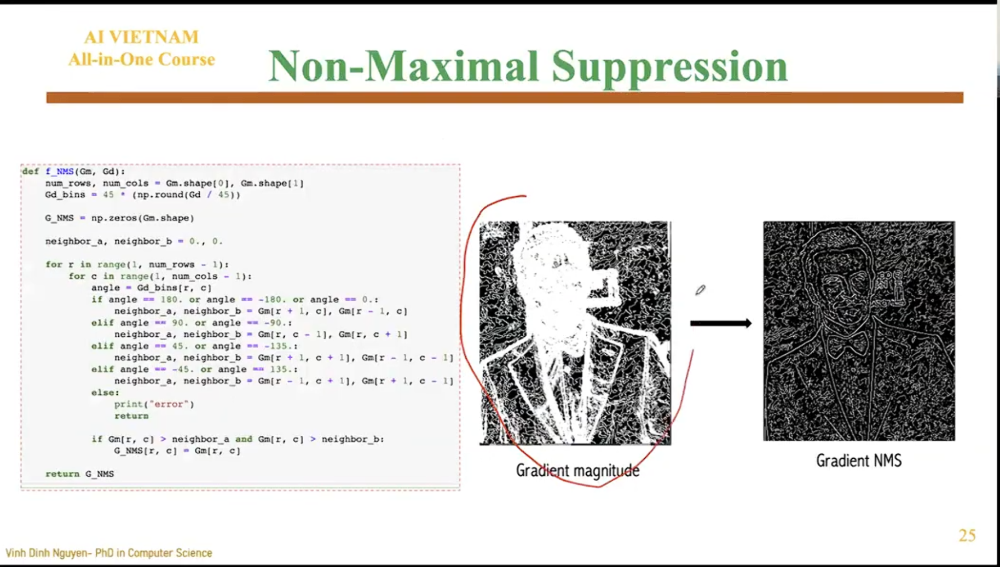

In [33]:
def non_maximal_suppresion(magnitude, angle_deg):
    rows, cols = magnitude.shape

    result = np.zeros((rows, cols), dtype=np.float32)

    snapped_angles = 45 * np.round(angle_deg / 45)

    for y in range(1, rows - 1):
        for x in range(1, cols - 1):

            current_angle = snapped_angles[y, x]
            current_magnitude = magnitude[y, x]

            neighbor_1 = 0
            neighbor_2 = 0

            # ----------------------------------------------------
            # TÌM 2 NGƯỜI HÀNG XÓM DỰA VÀO GÓC
            # ----------------------------------------------------

            # 1. Hướng NGANG (0 hoặc 180 độ) -> So sánh với pixel Trái và Phải
            if current_angle == 0 or current_angle == 180 or current_angle == -180:
                neighbor_1 = magnitude[y, x + 1]
                neighbor_2 = magnitude[y, x - 1]
            
            # 2. Hướng DỌC (90 hoặc -90 độ) -> So sánh với pixel Trên và Dưới
            elif current_angle == 90 or current_angle == -90:
                neighbor_1 = magnitude[y + 1, x]
                neighbor_2 = magnitude[y - 1, x]
            
            # 3. Hướng CHÉO 1 (45 hoặc -135 độ) -> Góc dưới-phải và trên-trái
            elif current_angle == 45 or current_angle == -135:
                neighbor_1 = magnitude[y + 1, x + 1]
                neighbor_2 = magnitude[y - 1, x - 1]
            
            # 4. Hướng CHÉO 2 (-45 hoặc 135 độ) -> Góc trên-phải và dưới-trái
            elif current_angle == -45 or current_angle == 135:
                neighbor_1 = magnitude[y - 1, x + 1]
                neighbor_2 = magnitude[y + 1, x - 1]
            
            if current_magnitude >= neighbor_1 and current_magnitude >= neighbor_2:
                result[y, x] = current_magnitude
            else:
                result[y, x] = 0
        
    return result

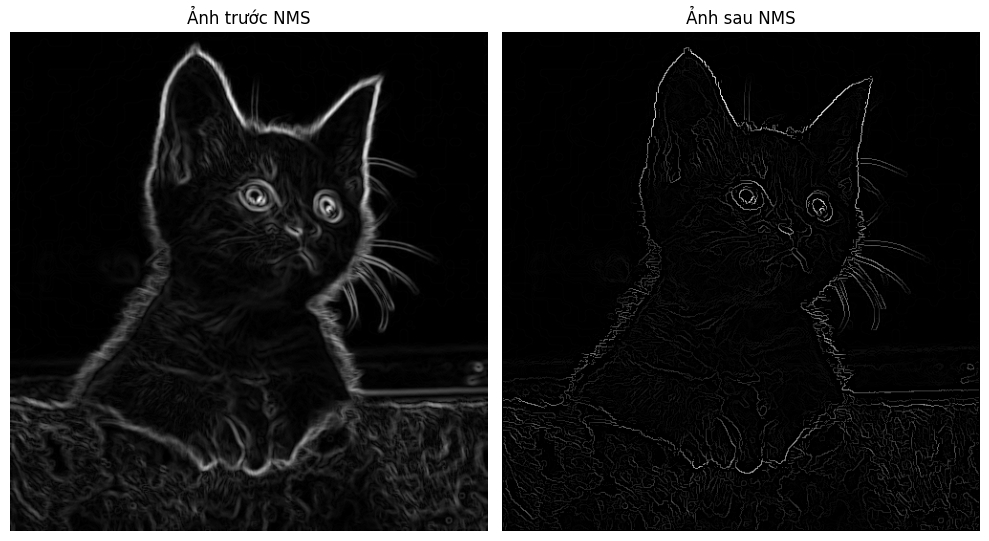

In [34]:
img_result = non_maximal_suppresion(magnitude, angle_deg)

plt.figure(figsize=(10, 12))

plt.subplot(2, 2, 1)
plt.imshow(magnitude, cmap='gray')
plt.title('Ảnh trước NMS')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(img_result, cmap='gray')
plt.title('Ảnh sau NMS')
plt.axis('off')

plt.tight_layout()
plt.show()

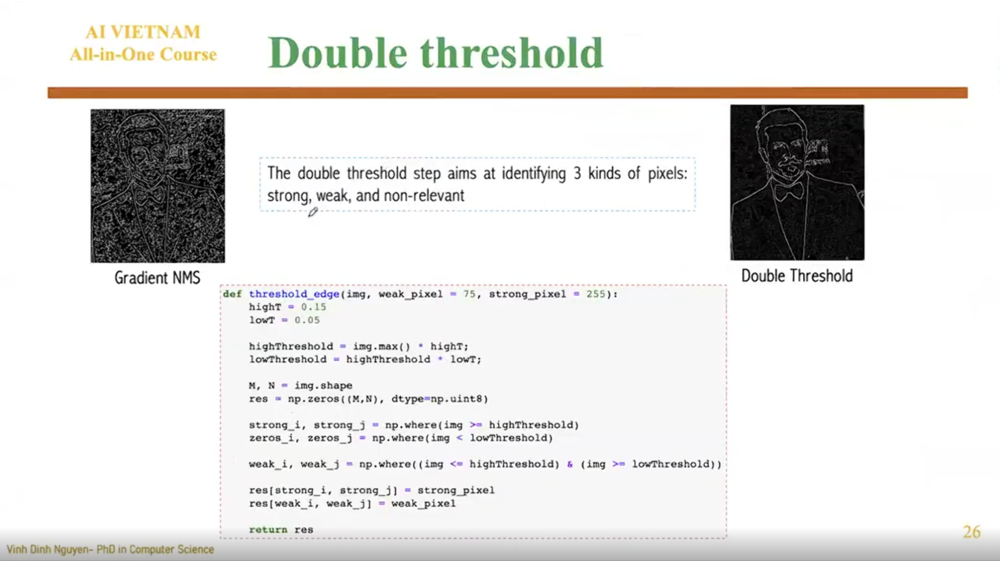

**1. Tại sao không dùng 1 ngưỡng (Single Threshold)?**

- Sau khi làm mỏng viền bằng Non-Maximal Suppression (NMS), bức ảnh của chúng ta có những viền rất sáng (cạnh thật), nhưng cũng có những viền mờ mờ lấm tấm do nhiễu hoặc vân bề mặt tạo ra.

- Nếu ta chỉ đưa ra 1 mức điểm chuẩn duy nhất (ví dụ: pixel nào sáng $> 50$ thì giữ, $< 50$ thì xóa):
    - Nếu đặt ngưỡng quá cao: Ta sẽ vô tình xóa mất những đường biên thật nhưng hơi mờ, làm nét đứt gãy.
    - Nếu đặt ngưỡng quá thấp: Ta lại giữ lại cả đống rác nhiễu.

**2. Giải pháp: Dùng 2 ngưỡng (Double Threshold)**

- Thuật toán Canny sử dụng 2 mức điểm chuẩn: Ngưỡng cao (High Threshold) và Ngưỡng thấp (Low Threshold). Dựa vào đó, nó chia pixel thành 3 tầng lớp:
    - Tầng lớp 1: Strong Pixels (Chắc chắn là cạnh) * Điều kiện: Độ sáng $\ge$ Ngưỡng cao.
        - Xử lý: Đây chắc chắn là những đường biên rõ ràng nhất của vật thể. Code sẽ tô chúng thành màu trắng tinh, cường độ sáng tối đa (strong_pixel = 255).
    - Tầng lớp 2: Non-relevant / Zero Pixels (Chắc chắn là rác)
        - Điều kiện: Độ sáng $<$ Ngưỡng thấp.
        - Xử lý: Đây quá mờ nhạt, chắc chắn là nhiễu hạt. Code sẽ thẳng tay "tiêu diệt" chúng, biến thành màu đen thui (cường độ sáng bằng 0).
    - Tầng lớp 3: Weak Pixels (Vùng do dự - Tinh hoa của thuật toán)
        - Điều kiện: Ngưỡng thấp $\le$ Độ sáng $<$ Ngưỡng cao.
        - Xử lý: Đây là những điểm "lấp lửng". Máy tính không chắc nó là đường biên mờ hay là nhiễu sắc nét. Thay vì xóa đi, code sẽ "tạm giữ" chúng lại, đánh dấu bằng một màu xám mờ (weak_pixel = 75).
    


In [35]:
def double_threshold(img_nms, low_ratio=0.05, high_ratio=0.15):
    # 1. TẠO BỨC ẢNH TRỐNG (Mặc định toàn màu đen)
    # np.zeros_like sẽ tạo ra một mảng toàn số 0 có cùng kích thước với ảnh gốc.
    result = np.zeros_like(img_nms, dtype=np.uint8)

    STRONG_PIXEL = 255
    WEAK_PIXEL = 75

    # 2. TÍNH TOÁN NGƯỠNG (Dựa trên điểm sáng nhất của ảnh)
    max_val = np.max(img_nms)

    # High Threshold
    high_threshold = max_val * high_ratio

    # Low Threshold
    low_threshold = high_threshold * low_ratio

    # 3. PHÂN LOẠI & TÔ MÀU BẰNG NP.WHERE
    strong_y, strong_x = np.where(img_nms >= high_threshold)

    weak_y, weak_x = np.where((img_nms >= low_threshold) & (img_nms < high_threshold))

    result[strong_y, strong_x] = STRONG_PIXEL
    result[weak_y, weak_x] = WEAK_PIXEL

    return result    

**2. Ý nghĩa của high_threshold = max_val * high_ratio**

- max_val: Là giá trị độ sáng cao nhất (sáng chói nhất) tìm được trong bức ảnh gradient hiện tại. Nó đại diện cho "đường biên rõ ràng nhất" của bức ảnh đó.

- Tác dụng: Dòng lệnh này có nghĩa là: "Để được công nhận là một đường biên Mạnh (Strong), pixel đó phải có độ sáng đạt ít nhất bằng 15% (nếu high_ratio = 0.15) so với đường biên sáng nhất của ảnh".

- Ví dụ thực tế: Nếu điểm sáng nhất của ảnh là 200 và high_ratio = 0.15.
$\rightarrow$ high_threshold = 200 * 0.15 = 30. Mọi pixel có độ sáng $\ge 30$ sẽ được phong làm viền Mạnh (màu trắng).

**3. Ý nghĩa của low_threshold = high_threshold * low_ratio**

- Tác dụng: Dòng lệnh này tính Ngưỡng thấp (Low Threshold) dựa trên phần trăm của chính Ngưỡng cao vừa tính được ở trên.

- Nó có nghĩa là: "Để được vớt vát làm một đường biên Yếu (Weak), pixel đó không được quá tối, nó phải đạt ít nhất bằng 5% (nếu low_ratio = 0.05) độ sáng của Ngưỡng cao".

- Ví dụ tiếp tục:
Với high_threshold = 30 vừa tính được, và low_ratio = 0.05.
$\rightarrow$ low_threshold = 30 * 0.05 = 1.5.
Mọi pixel lọt thỏm trong khoảng từ 1.5 đến dưới 30 sẽ bị xếp vào nhóm viền Yếu (màu xám do dự). Những pixel nào tối hơn 1.5 sẽ bị coi là rác nhiễu và vứt bỏ hoàn toàn.

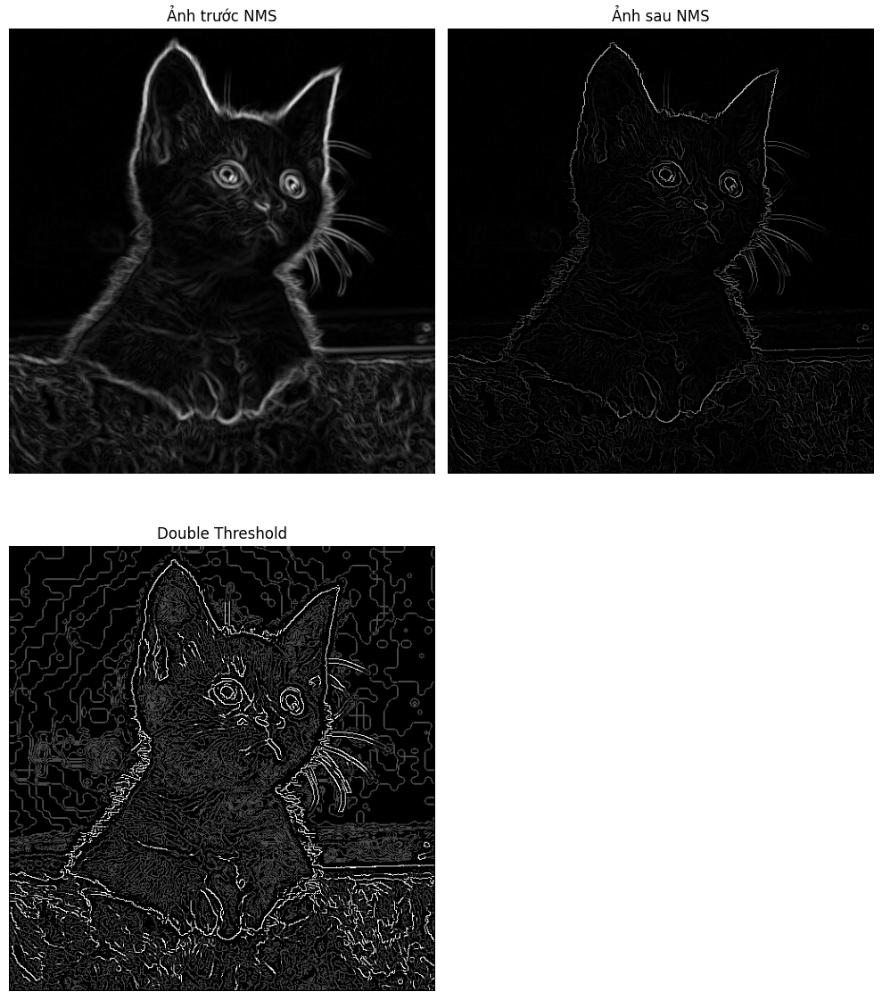

In [36]:
img_double_threshold = double_threshold(img_result)

plt.figure(figsize=(10, 12))

plt.subplot(2, 2, 1)
plt.imshow(magnitude, cmap='gray')
plt.title('Ảnh trước NMS')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(img_result, cmap='gray')
plt.title('Ảnh sau NMS')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(img_double_threshold, cmap='gray')
plt.title('Double Threshold')
plt.axis('off')

plt.tight_layout()
plt.show()

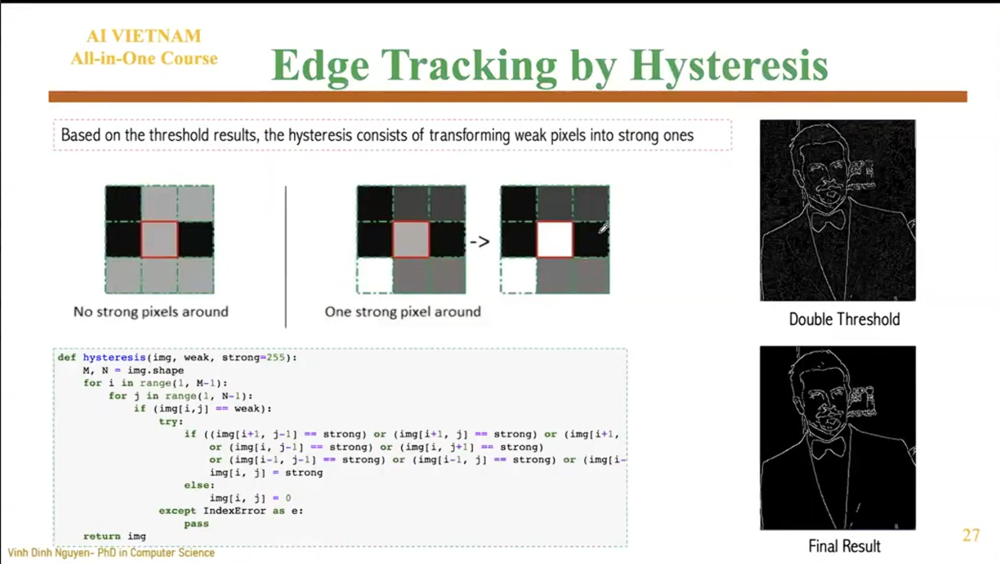

**1. Luật chơi: "Gần đèn thì rạng"**

- Trong thực tế, một đường biên của vật thể thường là một đường nét liền mạch. Nếu một đoạn viền bị mờ (Weak) nhưng nó lại dính liền với một đoạn viền cực kỳ sắc nét (Strong), thì 99% đoạn mờ đó chính là một phần của cái viền thật bị thiếu sáng. Ngược lại, nếu một đốm mờ nằm chỏng chơ một mình giữa không gian, nó chắc chắn là nhiễu hạt.

Dựa vào logic đó, Hysteresis xét 8 pixel hàng xóm xung quanh một pixel Weak (ô viền đỏ trong hình):
- Trường hợp 1: "No strong pixels around" (Không có ai chống lưng)
    - Nhìn vào hình vuông bên trái: Pixel màu xám ở giữa bị bao quanh bởi toàn các pixel đen (rác) hoặc xám khác.

    - Kết cục: Nó bị đánh giá là nhiễu cô lập. Lập tức bị "tiêu diệt" và chuyển thành màu đen (giá trị 0).

- Trường hợp 2: "One strong pixel around" (Có "đại ca" bảo kê)
    - Nhìn vào hình vuông bên phải: Pixel xám ở giữa có một hàng xóm lân cận là pixel Trắng (Strong) ở góc dưới bên trái.

    - Kết cục: Nó được "thăng cấp" (transforming weak pixels into strong ones). Nó sẽ được thắp sáng thành màu trắng (giá trị 255) và chính thức nối liền vào đường biên thật.



In [53]:
def edge_tracking_hysteresis(img_double_threshold, weak_val = 75, strong_val = 255):
    """
    Hàm theo vết cạnh: Thăng cấp pixel Yếu thành Mạnh nếu nó nối với pixel Mạnh.
    img_double_thresh: Ảnh đầu vào đã qua bước Double Threshold.
    """
    result = np.array(img_double_threshold, dtype=np.uint8)
    rows, cols = result.shape

    # 2. QUÉT QUA TỪNG PIXEL (Bỏ qua viền ngoài cùng 1 pixel để an toàn)
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            
            if int(result[i, j]) == weak_val:

                # Cắt lấy vùng không gian 3x3 bao quanh pixel hiện tại (i, j)
                neighborhood = result[i - 1: i + 2, j - 1: j + 2]

                if (neighborhood == strong_val).any():
                    result[i, j] = strong_val
                else:
                    result[i, j] = 0
    return result


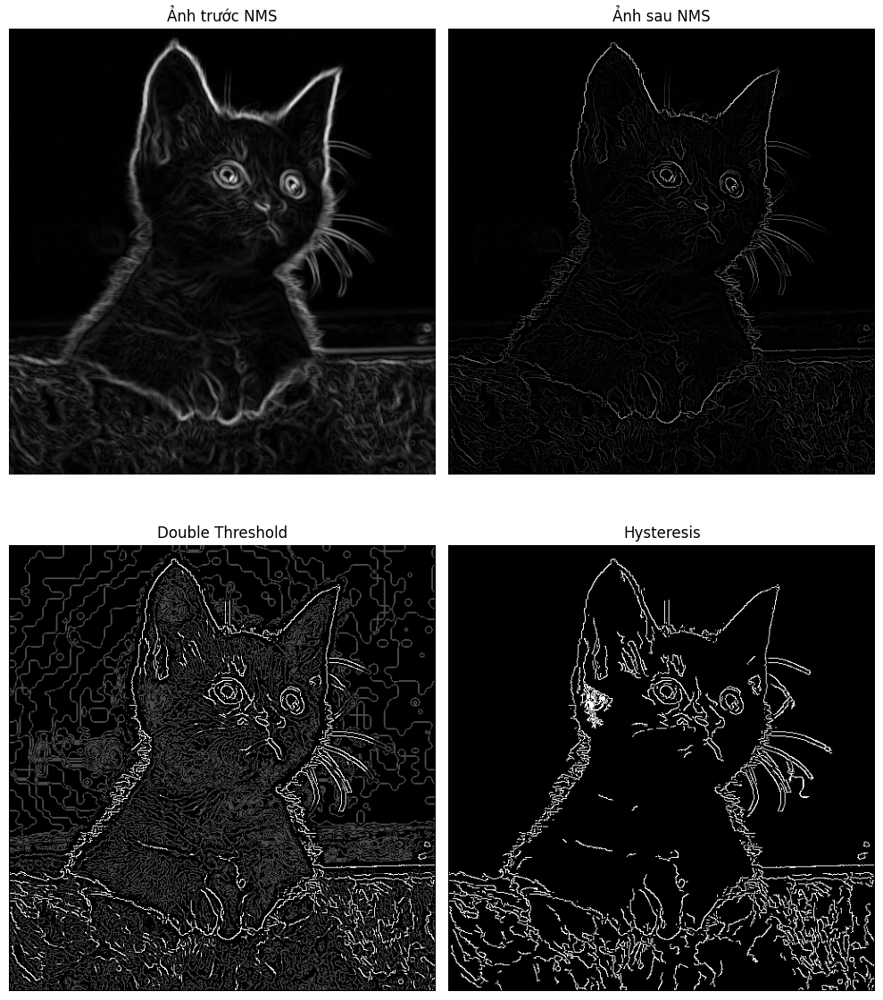

In [54]:
final_img = edge_tracking_hysteresis(img_double_threshold)

plt.figure(figsize=(10, 12))

plt.subplot(2, 2, 1)
plt.imshow(magnitude, cmap='gray')
plt.title('Ảnh trước NMS')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(img_result, cmap='gray')
plt.title('Ảnh sau NMS')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(img_double_threshold, cmap='gray')
plt.title('Double Threshold')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(final_img, cmap='gray')
plt.title('Hysteresis')
plt.axis('off')

plt.tight_layout()
plt.show()